In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression  
from sklearn.metrics import r2_score 

pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv(r"C:\Data Analytics - Master course Simplilearn\Course 3 - Programming Basics and Data Analytics with Python\googleplaystore.csv")

In [3]:
df.shape

(10841, 13)

In [4]:
df.describe()

,Rating
count,9367.000000
mean,4.193338
std,0.537431
min,1.000000
25%,4.000000
50%,4.300000
75%,4.500000
max,19.000000


In [5]:
number_of_unique_apps = df['App'].nunique()
number_of_unique_apps 

9660

In [6]:
name_of_unique_apps = df['App'].unique()
name_of_unique_apps

for App in name_of_unique_apps:
    print(App)

Photo Editor & Candy Camera & Grid & ScrapBook
Coloring book moana
U Launcher Lite – FREE Live Cool Themes, Hide Apps
Sketch - Draw & Paint
Pixel Draw - Number Art Coloring Book
Paper flowers instructions
Smoke Effect Photo Maker - Smoke Editor
Infinite Painter
Garden Coloring Book
Kids Paint Free - Drawing Fun
Text on Photo - Fonteee
Name Art Photo Editor - Focus n Filters
Tattoo Name On My Photo Editor
Mandala Coloring Book
3D Color Pixel by Number - Sandbox Art Coloring
Learn To Draw Kawaii Characters
Photo Designer - Write your name with shapes
350 Diy Room Decor Ideas
FlipaClip - Cartoon animation
ibis Paint X
Logo Maker - Small Business
Boys Photo Editor - Six Pack & Men's Suit
Superheroes Wallpapers | 4K Backgrounds
Mcqueen Coloring pages
HD Mickey Minnie Wallpapers
Harley Quinn wallpapers HD
Colorfit - Drawing & Coloring
Animated Photo Editor
Pencil Sketch Drawing
Easy Realistic Drawing Tutorial
Pink Silver Bow Keyboard Theme
Art Drawing Ideas
Anime Manga Coloring Book
Easy Ori

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


In [8]:
check_null = df.isnull().sum()
check_null

App                  0
Category             0
Rating            1474
Reviews              0
Size                 0
Installs             0
Type                 1
Price                0
Content Rating       1
Genres               0
Last Updated         0
Current Ver          8
Android Ver          3
dtype: int64

In [9]:
check_null = df.isnull().sum().sum()
check_null

1487

In [10]:
df1 = df.copy()

In [11]:
df1 = df1.dropna()

In [12]:
df1.shape

(9360, 13)

In [13]:
#Extract the numeric value from the column
#Multiply the value by 1,000, if size is mentioned in Mb

def convert_Size(Size):
    if 'M' in Size:
        x = Size[:-1]
        x = float(x) * 1000
        return x
    elif 'k' == Size[-1]:  # Corrected comparison
        x = Size[:-1]
        x = float(x)
        return x
    else:
        return None

df1["Size"] = df1["Size"].map(convert_Size)
#df1["Size"]

In [14]:
df1

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19000.0,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14000.0,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8700.0,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25000.0,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2800.0,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up
5,Paper flowers instructions,ART_AND_DESIGN,4.4,167,5600.0,"50,000+",Free,0,Everyone,Art & Design,"March 26, 2017",1.0,2.3 and up
6,Smoke Effect Photo Maker - Smoke Editor,ART_AND_DESIGN,3.8,178,19000.0,"50,000+",Free,0,Everyone,Art & Design,"April 26, 2018",1.1,4.0.3 and up
7,Infinite Painter,ART_AND_DESIGN,4.1,36815,29000.0,"1,000,000+",Free,0,Everyone,Art & Design,"June 14, 2018",6.1.61.1,4.2 and up
8,Garden Coloring Book,ART_AND_DESIGN,4.4,13791,33000.0,"1,000,000+",Free,0,Everyone,Art & Design,"September 20, 2017",2.9.2,3.0 and up
9,Kids Paint Free - Drawing Fun,ART_AND_DESIGN,4.7,121,3100.0,"10,000+",Free,0,Everyone,Art & Design;Creativity,"July 3, 2018",2.8,4.0.3 and up


In [15]:
df1.Size.describe()

count      7723.000000
mean      22970.456105
std       23449.628935
min           8.500000
25%        5300.000000
50%       14000.000000
75%       33000.000000
max      100000.000000
Name: Size, dtype: float64

In [16]:
df1['Size'].ffill(inplace=True)

In [17]:
df1.isnull().sum()

App               0
Category          0
Rating            0
Reviews           0
Size              0
Installs          0
Type              0
Price             0
Content Rating    0
Genres            0
Last Updated      0
Current Ver       0
Android Ver       0
dtype: int64

In [18]:
df1.dtypes

App                object
Category           object
Rating            float64
Reviews            object
Size              float64
Installs           object
Type               object
Price              object
Content Rating     object
Genres             object
Last Updated       object
Current Ver        object
Android Ver        object
dtype: object

In [19]:
df1['Reviews'] = df1.Reviews.astype('int32')

In [20]:
df1.dtypes

App                object
Category           object
Rating            float64
Reviews             int32
Size              float64
Installs           object
Type               object
Price              object
Content Rating     object
Genres             object
Last Updated       object
Current Ver        object
Android Ver        object
dtype: object

In [21]:
df1.Reviews.describe()

count    9.360000e+03
mean     5.143767e+05
std      3.145023e+06
min      1.000000e+00
25%      1.867500e+02
50%      5.955000e+03
75%      8.162750e+04
max      7.815831e+07
Name: Reviews, dtype: float64

In [22]:
df1['Installs'].value_counts()

Installs
1,000,000+        1576
10,000,000+       1252
100,000+          1150
10,000+           1009
5,000,000+         752
1,000+             712
500,000+           537
50,000+            466
5,000+             431
100,000,000+       409
100+               309
50,000,000+        289
500+               201
500,000,000+        72
10+                 69
1,000,000,000+      58
50+                 56
5+                   9
1+                   3
Name: count, dtype: int64

In [23]:
def rep(value):
    return int(value.replace(",","").replace("+",""))
df1.Installs = df1.Installs.map(rep)
df1

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19000.0,10000,Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14000.0,500000,Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8700.0,5000000,Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25000.0,50000000,Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2800.0,100000,Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up
5,Paper flowers instructions,ART_AND_DESIGN,4.4,167,5600.0,50000,Free,0,Everyone,Art & Design,"March 26, 2017",1.0,2.3 and up
6,Smoke Effect Photo Maker - Smoke Editor,ART_AND_DESIGN,3.8,178,19000.0,50000,Free,0,Everyone,Art & Design,"April 26, 2018",1.1,4.0.3 and up
7,Infinite Painter,ART_AND_DESIGN,4.1,36815,29000.0,1000000,Free,0,Everyone,Art & Design,"June 14, 2018",6.1.61.1,4.2 and up
8,Garden Coloring Book,ART_AND_DESIGN,4.4,13791,33000.0,1000000,Free,0,Everyone,Art & Design,"September 20, 2017",2.9.2,3.0 and up
9,Kids Paint Free - Drawing Fun,ART_AND_DESIGN,4.7,121,3100.0,10000,Free,0,Everyone,Art & Design;Creativity,"July 3, 2018",2.8,4.0.3 and up


In [24]:
df1.Price.describe()

count     9360
unique      73
top          0
freq      8715
Name: Price, dtype: object

In [25]:
df1['Price'] = df1.Price.map(lambda x : 0 if x == '0' else float(x[1:]))

In [26]:
df1.Price.describe()

count    9360.000000
mean        0.961279
std        15.821640
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       400.000000
Name: Price, dtype: float64

In [27]:
df1.Rating.describe()

count    9360.000000
mean        4.191838
std         0.515263
min         1.000000
25%         4.000000
50%         4.300000
75%         4.500000
max         5.000000
Name: Rating, dtype: float64

In [29]:
df1[df1.Rating > df1.Installs]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
2454,KBA-EZ Health Guide,MEDICAL,5.0,4,25000.0,1,Free,0.00,Everyone,Medical,"August 2, 2018",1.0.72,4.0.3 and up
5917,Ra Ga Ba,GAME,5.0,2,20000.0,1,Paid,1.49,Everyone,Arcade,"February 8, 2017",1.0.4,2.3 and up
10697,Mu.F.O.,GAME,5.0,2,16000.0,1,Paid,0.99,Everyone,Arcade,"March 3, 2017",1.0,2.3 and up


In [30]:
df1 = df1[df1.Reviews <= df1.Installs].copy()

In [31]:
df1.shape

(9353, 13)

In [32]:
df1[(df1.Type == "Free") & (df1.Price > 0)]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver


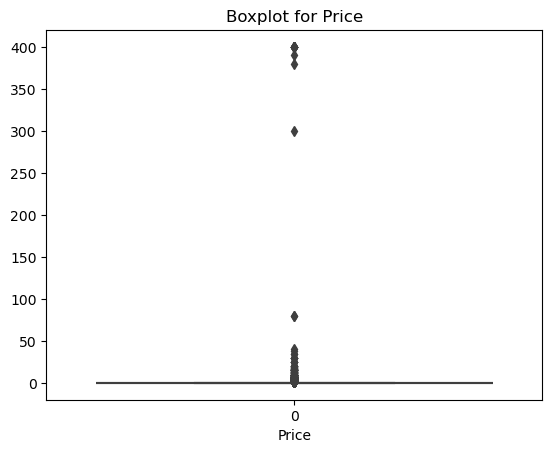

In [35]:
sns.boxplot(df1['Price'])
plt.title('Boxplot for Price')
plt.xlabel('Price')
plt.show()

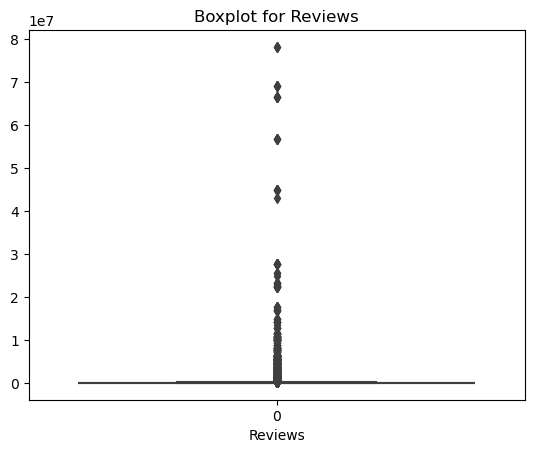

In [39]:
# Creating a boxplot for the Reviews column
sns.boxplot(df1['Reviews'])
plt.title('Boxplot for Reviews')
plt.xlabel('Reviews')
plt.show()

In [38]:
# Identifying high-review apps
Q1_reviews = df1['Reviews'].quantile(0.25)
Q3_reviews = df1['Reviews'].quantile(0.75)
IQR_reviews = Q3_reviews - Q1_reviews
lower_bound_reviews = Q1_reviews - 1.5 * IQR_reviews
upper_bound_reviews = Q3_reviews + 1.5 * IQR_reviews

high_review_apps = df1[df1['Reviews'] > upper_bound_reviews]
print("Apps with very high number of reviews:")
print(high_review_apps)


Apps with very high number of reviews:
                                                     App             Category  \
3                                  Sketch - Draw & Paint       ART_AND_DESIGN   
19                                          ibis Paint X       ART_AND_DESIGN   
42                            Textgram - write on photos       ART_AND_DESIGN   
72         Android Auto - Maps, Media, Messaging & Voice    AUTO_AND_VEHICLES   
139                                 Wattpad 📖 Free Books  BOOKS_AND_REFERENCE   
142                                            Wikipedia  BOOKS_AND_REFERENCE   
143                                        Amazon Kindle  BOOKS_AND_REFERENCE   
144                                          Cool Reader  BOOKS_AND_REFERENCE   
145                         Dictionary - Merriam-Webster  BOOKS_AND_REFERENCE   
152                                    Google Play Books  BOOKS_AND_REFERENCE   
155                  Oxford Dictionary of English : Free  BOOKS_AND_RE

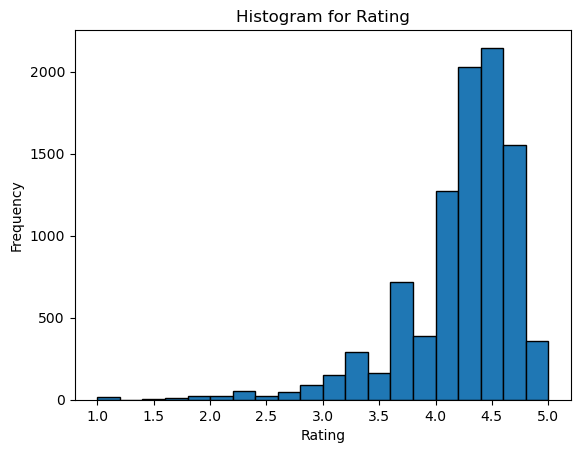

In [40]:
# Creating a histogram for the Rating column
plt.hist(df1['Rating'], bins=20, edgecolor='black')
plt.title('Histogram for Rating')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.show()

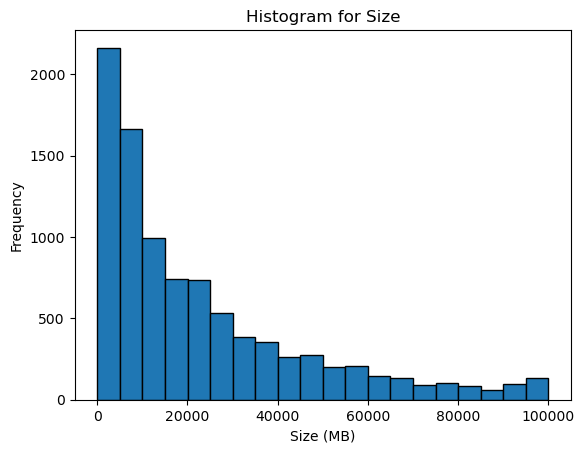

In [41]:
# Creating a histogram for the Size column
plt.hist(df1['Size'], bins=20, edgecolor='black')
plt.title('Histogram for Size')
plt.xlabel('Size (MB)')
plt.ylabel('Frequency')
plt.show()

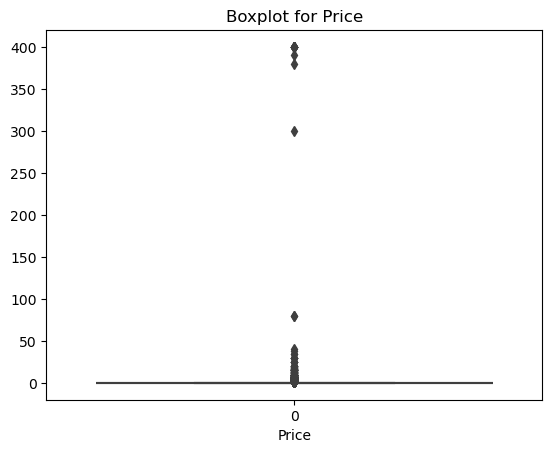

In [43]:
# 1. Visualize the Price Data
sns.boxplot(df1['Price'])
plt.title('Boxplot for Price')
plt.xlabel('Price')
plt.show()

In [44]:
# 2. Identify High-Price Records
high_price_threshold = 200
high_price_records = df1[df1['Price'] > high_price_threshold]
print("Records with very high price:")
print(high_price_records)


Records with very high price:
                                 App   Category  Rating  Reviews     Size  \
4197          most expensive app (H)     FAMILY     4.3        6   1500.0   
4362                      💎 I'm rich  LIFESTYLE     3.8      718  26000.0   
4367        I'm Rich - Trump Edition  LIFESTYLE     3.6      275   7300.0   
5351                       I am rich  LIFESTYLE     3.8     3547   1800.0   
5354                  I am Rich Plus     FAMILY     4.0      856   8700.0   
5355                   I am rich VIP  LIFESTYLE     3.8      411   2600.0   
5356               I Am Rich Premium    FINANCE     4.1     1867   4700.0   
5357             I am extremely Rich  LIFESTYLE     2.9       41   2900.0   
5358                      I am Rich!    FINANCE     3.8       93  22000.0   
5359              I am rich(premium)    FINANCE     3.5      472    965.0   
5362                   I Am Rich Pro     FAMILY     4.4      201   2700.0   
5364  I am rich (Most expensive app)    FINANC

In [45]:
# 3. Determine if $200 is High
price_stats = df1['Price'].describe()
print("Summary statistics for Price:")
print(price_stats)

Summary statistics for Price:
count    9353.000000
mean        0.961467
std        15.827539
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       400.000000
Name: Price, dtype: float64


In [46]:
# 4. Drop High-Price Records
df1_cleaned = df1[df1['Price'] <= high_price_threshold]
print("Dataframe after dropping high-price records:")
print(df1_cleaned.head())

Dataframe after dropping high-price records:
                                                 App        Category  Rating  \
0     Photo Editor & Candy Camera & Grid & ScrapBook  ART_AND_DESIGN     4.1   
1                                Coloring book moana  ART_AND_DESIGN     3.9   
2  U Launcher Lite – FREE Live Cool Themes, Hide ...  ART_AND_DESIGN     4.7   
3                              Sketch - Draw & Paint  ART_AND_DESIGN     4.5   
4              Pixel Draw - Number Art Coloring Book  ART_AND_DESIGN     4.3   

   Reviews     Size  Installs  Type  Price Content Rating  \
0      159  19000.0     10000  Free    0.0       Everyone   
1      967  14000.0    500000  Free    0.0       Everyone   
2    87510   8700.0   5000000  Free    0.0       Everyone   
3   215644  25000.0  50000000  Free    0.0           Teen   
4      967   2800.0    100000  Free    0.0       Everyone   

                      Genres      Last Updated         Current Ver  \
0               Art & Design   Januar

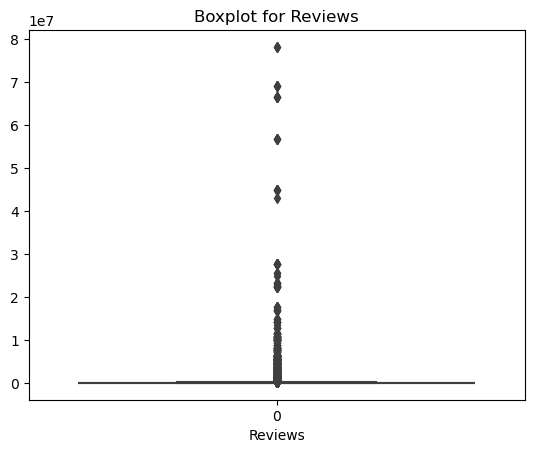

In [50]:
# 1. Visualize the Reviews Data
sns.boxplot(df1['Reviews'])
plt.title('Boxplot for Reviews')
plt.xlabel('Reviews')
plt.show()

In [52]:
high_review_threshold = 2_000_000
high_review_records = df1[df1['Reviews'] > high_review_threshold]
print("Records with very high number of reviews:")
print(high_review_records)

Records with very high number of reviews:
                                                     App             Category  \
139                                 Wattpad 📖 Free Books  BOOKS_AND_REFERENCE   
335             Messenger – Text and Video Chat for Free        COMMUNICATION   
336                                   WhatsApp Messenger        COMMUNICATION   
338                         Google Chrome: Fast & Secure        COMMUNICATION   
340                                                Gmail        COMMUNICATION   
341                                             Hangouts        COMMUNICATION   
342                                      Viber Messenger        COMMUNICATION   
344                       Firefox Browser fast & private        COMMUNICATION   
345                          Yahoo Mail – Stay Organized        COMMUNICATION   
347                        imo free video calls and chat        COMMUNICATION   
351                        Opera Mini - fast web browser        COM

In [53]:
# 3. Drop High-Review Records
df1_cleaned = df1[df1['Reviews'] <= high_review_threshold]
print("Dataframe after dropping high-review records:")
print(df1_cleaned.head())

Dataframe after dropping high-review records:
                                                 App        Category  Rating  \
0     Photo Editor & Candy Camera & Grid & ScrapBook  ART_AND_DESIGN     4.1   
1                                Coloring book moana  ART_AND_DESIGN     3.9   
2  U Launcher Lite – FREE Live Cool Themes, Hide ...  ART_AND_DESIGN     4.7   
3                              Sketch - Draw & Paint  ART_AND_DESIGN     4.5   
4              Pixel Draw - Number Art Coloring Book  ART_AND_DESIGN     4.3   

   Reviews     Size  Installs  Type  Price Content Rating  \
0      159  19000.0     10000  Free    0.0       Everyone   
1      967  14000.0    500000  Free    0.0       Everyone   
2    87510   8700.0   5000000  Free    0.0       Everyone   
3   215644  25000.0  50000000  Free    0.0           Teen   
4      967   2800.0    100000  Free    0.0       Everyone   

                      Genres      Last Updated         Current Ver  \
0               Art & Design   Janua

In [54]:
# Calculate percentiles for the Installs column
percentiles = df1['Installs'].quantile([0.10, 0.25, 0.50, 0.70, 0.90, 0.95, 0.99])
print("Percentiles for Installs:")
print(percentiles)


Percentiles for Installs:
0.10         1000.0
0.25        10000.0
0.50       500000.0
0.70      5000000.0
0.90     10000000.0
0.95    100000000.0
0.99    500000000.0
Name: Installs, dtype: float64


In [55]:
# Decide on a threshold for outliers (using 99th percentile as an example)
threshold = percentiles[0.99]
print(f"Threshold for outliers based on 99th percentile: {threshold}")


Threshold for outliers based on 99th percentile: 500000000.0


In [56]:
# Drop records with Installs greater than the threshold
df1_cleaned = df1[df1['Installs'] <= threshold]
print("Dataframe after dropping high-install records:")
print(df1_cleaned.head())


Dataframe after dropping high-install records:
                                                 App        Category  Rating  \
0     Photo Editor & Candy Camera & Grid & ScrapBook  ART_AND_DESIGN     4.1   
1                                Coloring book moana  ART_AND_DESIGN     3.9   
2  U Launcher Lite – FREE Live Cool Themes, Hide ...  ART_AND_DESIGN     4.7   
3                              Sketch - Draw & Paint  ART_AND_DESIGN     4.5   
4              Pixel Draw - Number Art Coloring Book  ART_AND_DESIGN     4.3   

   Reviews     Size  Installs  Type  Price Content Rating  \
0      159  19000.0     10000  Free    0.0       Everyone   
1      967  14000.0    500000  Free    0.0       Everyone   
2    87510   8700.0   5000000  Free    0.0       Everyone   
3   215644  25000.0  50000000  Free    0.0           Teen   
4      967   2800.0    100000  Free    0.0       Everyone   

                      Genres      Last Updated         Current Ver  \
0               Art & Design   Janu

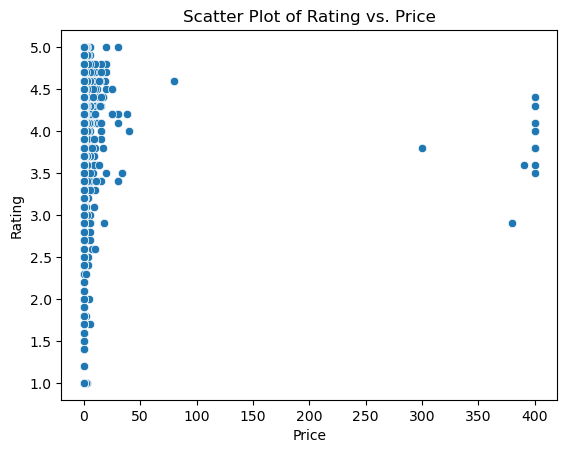

In [57]:
# Scatter plot for Rating vs. Price
sns.scatterplot(x='Price', y='Rating', data=df1)
plt.title('Scatter Plot of Rating vs. Price')
plt.xlabel('Price')
plt.ylabel('Rating')
plt.show()

C:\Users\harit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\harit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


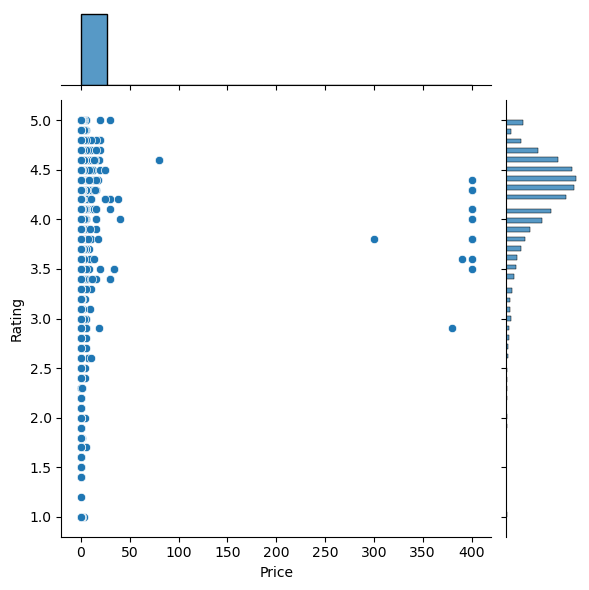

In [58]:

# Using joinplot for a more detailed analysis
sns.jointplot(x='Price', y='Rating', data=df1, kind='scatter')
plt.show()

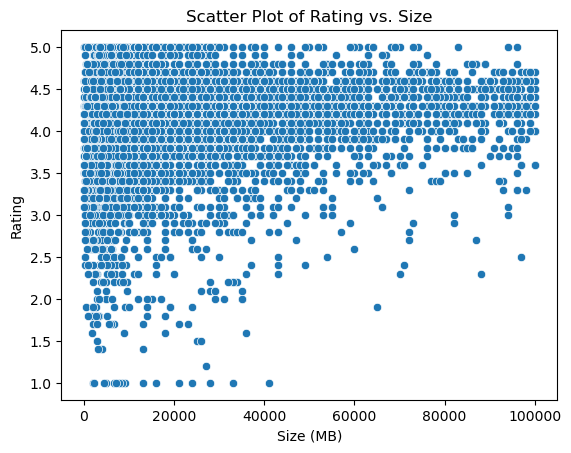

C:\Users\harit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\harit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


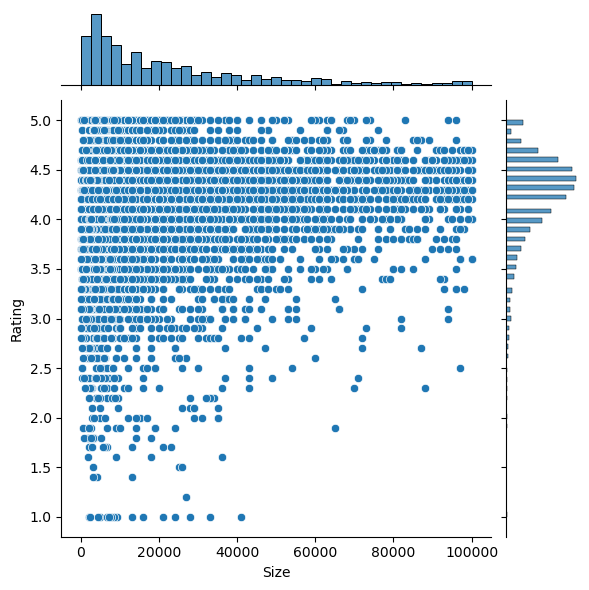

In [59]:
# Scatter plot for Rating vs. Size
sns.scatterplot(x='Size', y='Rating', data=df1)
plt.title('Scatter Plot of Rating vs. Size')
plt.xlabel('Size (MB)')
plt.ylabel('Rating')
plt.show()

# Using joinplot for a more detailed analysis
sns.jointplot(x='Size', y='Rating', data=df1, kind='scatter')
plt.show()


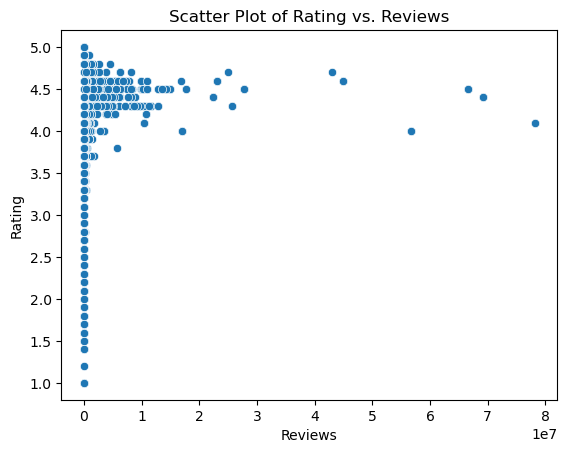

C:\Users\harit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\harit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


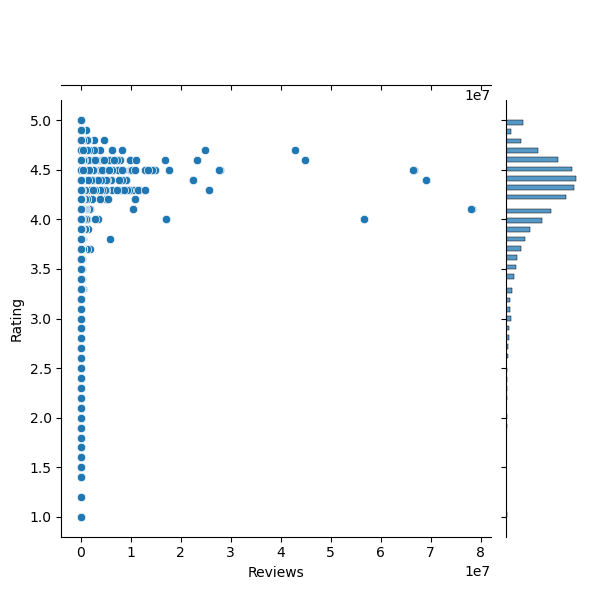

In [61]:
# Scatter plot for Rating vs. Reviews
sns.scatterplot(x='Reviews', y='Rating', data=df1)
plt.title('Scatter Plot of Rating vs. Reviews')
plt.xlabel('Reviews')
plt.ylabel('Rating')
plt.show()

# Using joinplot for a more detailed analysis
sns.jointplot(x='Reviews', y='Rating', data=df1, kind='scatter')
plt.show()


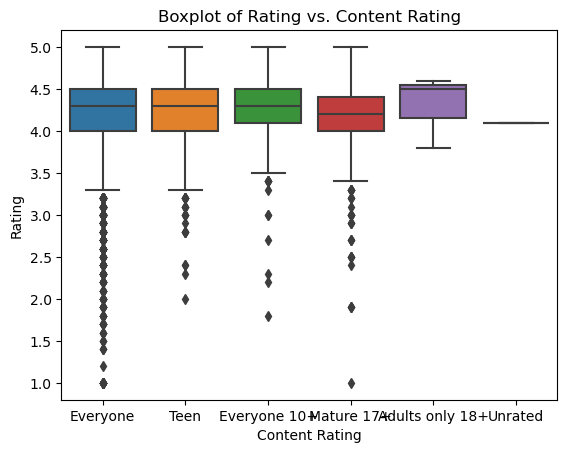

In [62]:
# Boxplot for Rating vs. Content Rating
sns.boxplot(x='Content Rating', y='Rating', data=df1)
plt.title('Boxplot of Rating vs. Content Rating')
plt.xlabel('Content Rating')
plt.ylabel('Rating')
plt.show()


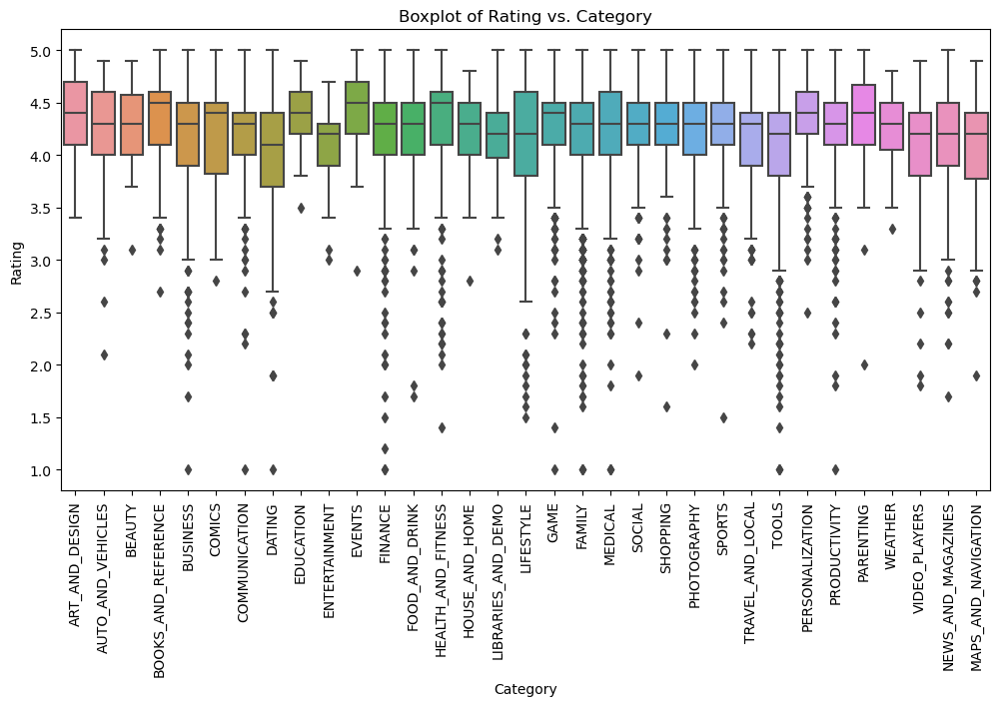

In [63]:
# Boxplot for Rating vs. Category
plt.figure(figsize=(12, 6))
sns.boxplot(x='Category', y='Rating', data=df1)
plt.xticks(rotation=90)
plt.title('Boxplot of Rating vs. Category')
plt.xlabel('Category')
plt.ylabel('Rating')
plt.show()


In [64]:
# Create a copy of the dataframe
inp1 = df1.copy()

In [65]:
# Apply log transformation to Reviews and Installs
inp1['Reviews'] = np.log1p(inp1['Reviews'])
inp1['Installs'] = np.log1p(inp1['Installs'])


In [66]:
# Drop unnecessary columns
inp1.drop(columns=['App', 'Last Updated', 'Current Ver', 'Android Ver'], inplace=True)


In [67]:
# Get dummy columns for Category, Genres, and Content Rating
inp2 = pd.get_dummies(inp1, columns=['Category', 'Genres', 'Content Rating'], drop_first=True)


In [68]:
print(inp2.head())

   Rating    Reviews     Size   Installs  Type  Price  \
0     4.1   5.075174  19000.0   9.210440  Free    0.0   
1     3.9   6.875232  14000.0  13.122365  Free    0.0   
2     4.7  11.379520   8700.0  15.424949  Free    0.0   
3     4.5  12.281389  25000.0  17.727534  Free    0.0   
4     4.3   6.875232   2800.0  11.512935  Free    0.0   

   Category_AUTO_AND_VEHICLES  Category_BEAUTY  Category_BOOKS_AND_REFERENCE  \
0                       False            False                         False   
1                       False            False                         False   
2                       False            False                         False   
3                       False            False                         False   
4                       False            False                         False   

   Category_BUSINESS  Category_COMICS  Category_COMMUNICATION  \
0              False            False                   False   
1              False            False         

In [71]:
# Split the data into training and testing sets
df1_train, df1_test = train_test_split(inp2, test_size=0.70, random_state=100)

# Display the size of the training and testing sets
print("Training set size:", df_train.shape)
print("Testing set size:", df_test.shape)


Training set size: (6547, 157)
Testing set size: (2806, 157)


In [74]:
# Separate the dataframes into X_train, y_train, X_test, and y_test
y_train = df_train['Rating']
y_test = df_test['Rating']

X_train = df_train.drop(columns=['Rating'])
X_test = df_test.drop(columns=['Rating'])

In [79]:
X_test.head()
y_test.head()

9407     3.4
6580     4.5
5599     4.4
10137    2.1
7755     3.9
Name: Rating, dtype: float64

In [82]:
# One-hot encode non-numeric columns
df_train = pd.get_dummies(df_train, columns=['Type'], drop_first=True)
df_test = pd.get_dummies(df_test, columns=['Type'], drop_first=True)

In [83]:
# Re-assign X_train, X_test after one-hot encoding
X_train = df_train.drop(columns=['Rating'])
X_test = df_test.drop(columns=['Rating'])


In [84]:
# Rebuild the Linear Regression model
model = LinearRegression()

In [85]:
# Train the model on the updated training data
model.fit(X_train, y_train)

LinearRegression()

In [86]:
# Predict ratings on the train set
y_train_pred = model.predict(X_train)

In [87]:
# Calculate R^2 on the train set
r2_train = r2_score(y_train, y_train_pred)
print("R^2 on the train set:", r2_train)

R^2 on the train set: 0.18169582398014383


In [88]:
# Predict ratings on the test set
y_test_pred = model.predict(X_test)


In [89]:
# Calculate R^2 on the test set
r2_test = r2_score(y_test, y_test_pred)
print("R^2 on the test set:", r2_test)


R^2 on the test set: 0.12364454248482182
